In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from pyspark.sql.functions import col
from pyspark.sql import functions as F
from pyspark.sql.window import Window
from pyspark.ml.feature import OneHotEncoder, VectorAssembler, StandardScaler, StringIndexer
from pyspark.ml import Pipeline
from pyspark.sql import SparkSession
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml import Pipeline

%matplotlib inline

In [0]:
file_location = "/FileStore/tables/salaries.csv"
file_type = "csv"

infer_schema = "false"
first_row_is_header = "true"
delimiter = ","

df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
2023,MI,FT,Data Manager,115500,USD,115500,US,0,US,M
2023,MI,FT,Data Manager,73500,USD,73500,US,0,US,M
2023,SE,FT,Machine Learning Engineer,309000,USD,309000,US,0,US,M
2023,SE,FT,Machine Learning Engineer,142000,USD,142000,US,0,US,M
2023,MI,FT,Bear Robotics,215000,USD,215000,US,0,US,M
2023,MI,FT,Bear Robotics,120000,USD,120000,US,0,US,M
2023,SE,FT,Data Engineer,139500,USD,139500,US,100,US,M
2023,SE,FT,Data Engineer,118575,USD,118575,US,100,US,M
2023,SE,FT,Data Analyst,129150,USD,129150,US,0,US,M
2023,SE,FT,Data Analyst,98400,USD,98400,US,0,US,M


In [0]:
df.printSchema()

root
 |-- work_year: string (nullable = true)
 |-- experience_level: string (nullable = true)
 |-- employment_type: string (nullable = true)
 |-- job_title: string (nullable = true)
 |-- salary: string (nullable = true)
 |-- salary_currency: string (nullable = true)
 |-- salary_in_usd: string (nullable = true)
 |-- employee_residence: string (nullable = true)
 |-- remote_ratio: string (nullable = true)
 |-- company_location: string (nullable = true)
 |-- company_size: string (nullable = true)



In [0]:
df = df.withColumn("salary_in_usd",df["salary_in_usd"].cast('float'))
df = df.withColumn("remote_ratio",df["remote_ratio"].cast('float'))

In [0]:
df.printSchema()

root
 |-- work_year: string (nullable = true)
 |-- experience_level: string (nullable = true)
 |-- employment_type: string (nullable = true)
 |-- job_title: string (nullable = true)
 |-- salary: string (nullable = true)
 |-- salary_currency: string (nullable = true)
 |-- salary_in_usd: float (nullable = true)
 |-- employee_residence: string (nullable = true)
 |-- remote_ratio: float (nullable = true)
 |-- company_location: string (nullable = true)
 |-- company_size: string (nullable = true)



In [0]:
df.describe().toPandas()

,summary,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,count,6886,6886,6886,6886,6886,6886,6886,6886,6886,6886,6886
1,mean,2022.6652628521638,None,None,None,179403.12097008422,None,147897.57566076095,None,41.29392971246006,None,None
2,stddev,0.5913232301872045,None,None,None,510898.4585725745,None,63868.229149238985,None,48.45555291219402,None,None
3,min,2020,EN,CT,AI Architect,100000,AUD,15000.0,AD,0.0,AD,L
4,max,2023,SE,PT,Staff Machine Learning Engineer,99750,ZAR,450000.0,ZA,100.0,ZA,S


In [0]:
string_columns = ['experience_level', 'employment_type', 'job_title', 'salary_currency', 'employee_residence', 'company_location', 'company_size']
numeric_columns = ['work_year','salary', 'salary_in_usd', 'remote_ratio']
missing_values = {} 
for index, column in enumerate(df.columns):
    if column in string_columns:
        missing_count = df.filter(col(column).eqNullSafe(None) | col(column).isNull()).count()
        missing_values.update({column:missing_count})
    if column in numeric_columns:
        missing_count = df.where(col(column).isin([0,None,np.nan])).count()
        missing_values.update({column:missing_count})
missing_df = pd.DataFrame.from_dict([missing_values])
missing_df

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,0,0,0,0,0,0,0,3937,0,0


In [0]:
df = df.drop(df.salary, df.salary_currency)

In [0]:
df.show()

+---------+----------------+---------------+--------------------+-------------+------------------+------------+----------------+------------+
|work_year|experience_level|employment_type|           job_title|salary_in_usd|employee_residence|remote_ratio|company_location|company_size|
+---------+----------------+---------------+--------------------+-------------+------------------+------------+----------------+------------+
|     2023|              MI|             FT|        Data Manager|     115500.0|                US|         0.0|              US|           M|
|     2023|              MI|             FT|        Data Manager|      73500.0|                US|         0.0|              US|           M|
|     2023|              SE|             FT|Machine Learning ...|     309000.0|                US|         0.0|              US|           M|
|     2023|              SE|             FT|Machine Learning ...|     142000.0|                US|         0.0|              US|           M|
|     

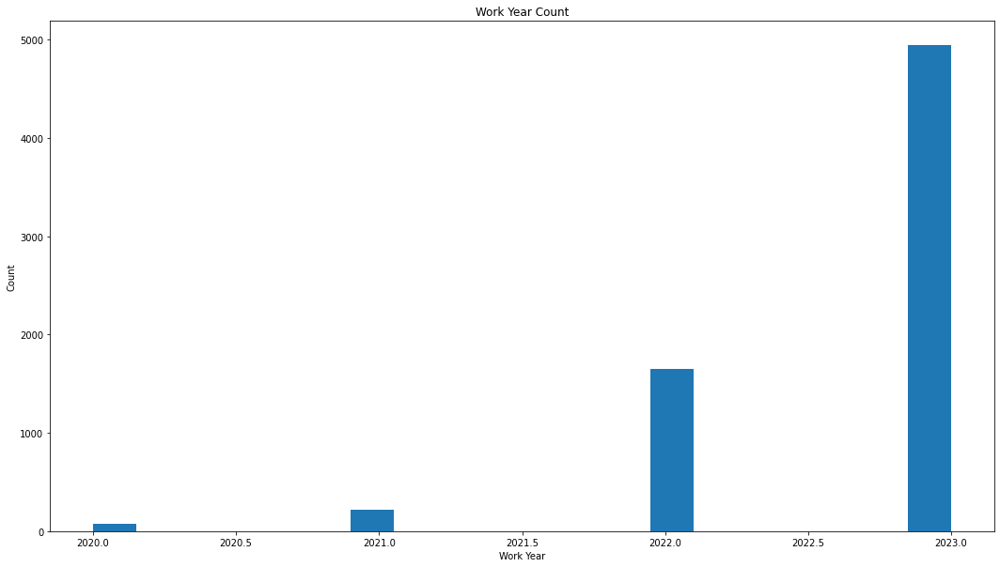

In [0]:
df_wy_num = df.withColumn("work_year", col("work_year").cast("integer"))

plt.figure(figsize=(18, 10), facecolor='white')
plt.xlabel("Work Year")
plt.ylabel("Count")
plt.title("Work Year Count")
plt.hist(df_wy_num.select("work_year").rdd.flatMap(lambda x: x).collect(), bins=20)

plt.show()

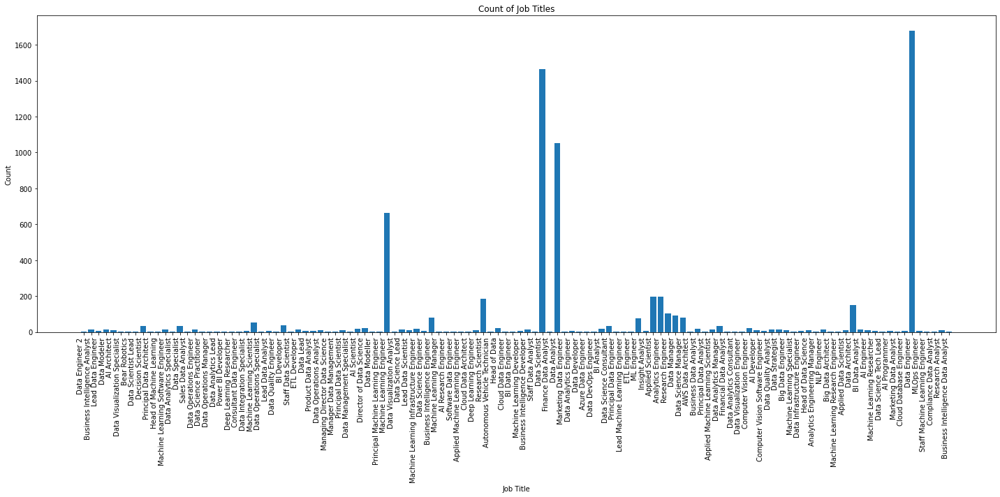

In [0]:
grouped_counts = df.groupBy("job_title").count().toPandas()

plt.figure(figsize=(20, 10), facecolor='white')
plt.bar(grouped_counts["job_title"], grouped_counts["count"])
plt.xlabel("Job Title")
plt.ylabel("Count")
plt.title("Count of Job Titles")
plt.xticks(rotation=90, ha="right")
plt.tight_layout()
plt.show()


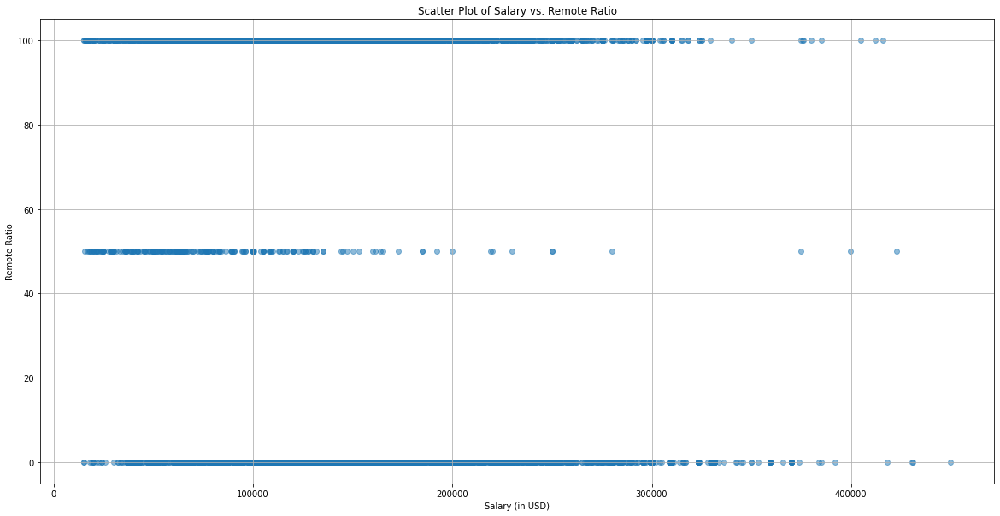

In [0]:
data = df.select("salary_in_usd", "remote_ratio").toPandas()

plt.figure(figsize=(20, 10), facecolor='white')
plt.scatter(data["salary_in_usd"], data["remote_ratio"], alpha=0.5)
plt.xlabel("Salary (in USD)")
plt.ylabel("Remote Ratio")
plt.title("Scatter Plot of Salary vs. Remote Ratio")
plt.grid(True)
plt.show()

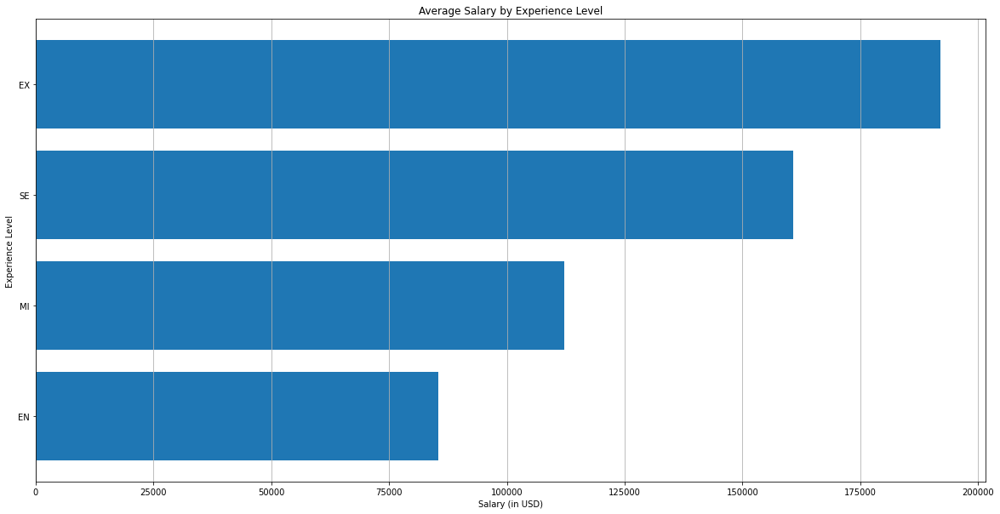

In [0]:
data = df.select("experience_level", "salary_in_usd").groupBy("experience_level").mean().orderBy("avg(salary_in_usd)").toPandas()

plt.figure(figsize=(20, 10), facecolor='white')
plt.barh(data["experience_level"], data["avg(salary_in_usd)"])
plt.xlabel("Salary (in USD)")
plt.ylabel("Experience Level")
plt.title("Average Salary by Experience Level")
plt.grid(axis="x")
plt.show()

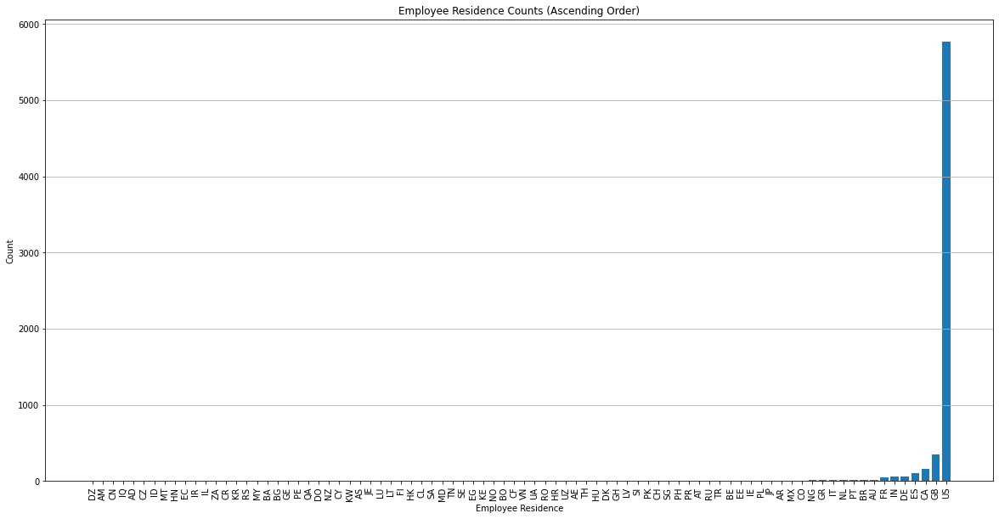

In [0]:
data = df.groupBy("employee_residence").count().orderBy("count").toPandas()

plt.figure(figsize=(20, 10), facecolor='white')
plt.bar(data["employee_residence"], data["count"])
plt.ylabel("Count")
plt.xlabel("Employee Residence")
plt.title("Employee Residence Counts (Ascending Order)")
plt.xticks(rotation=90)
plt.grid(axis="y")

plt.show()

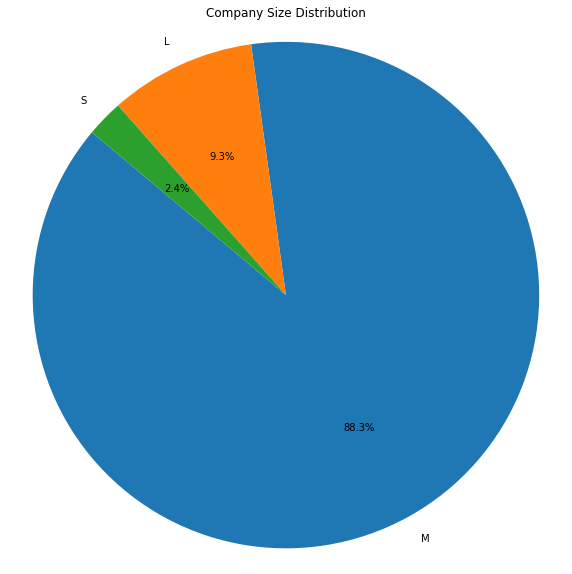

In [0]:
import matplotlib.pyplot as plt

data = df.groupBy("company_size").count().toPandas()

fig = plt.figure(figsize=(10, 10), facecolor='white')

plt.pie(data["count"], labels=data["company_size"], autopct="%1.1f%%", startangle=140)
plt.title("Company Size Distribution", color='black')

plt.gca().tick_params(axis='both', colors='white')

plt.axis("equal")

plt.show()

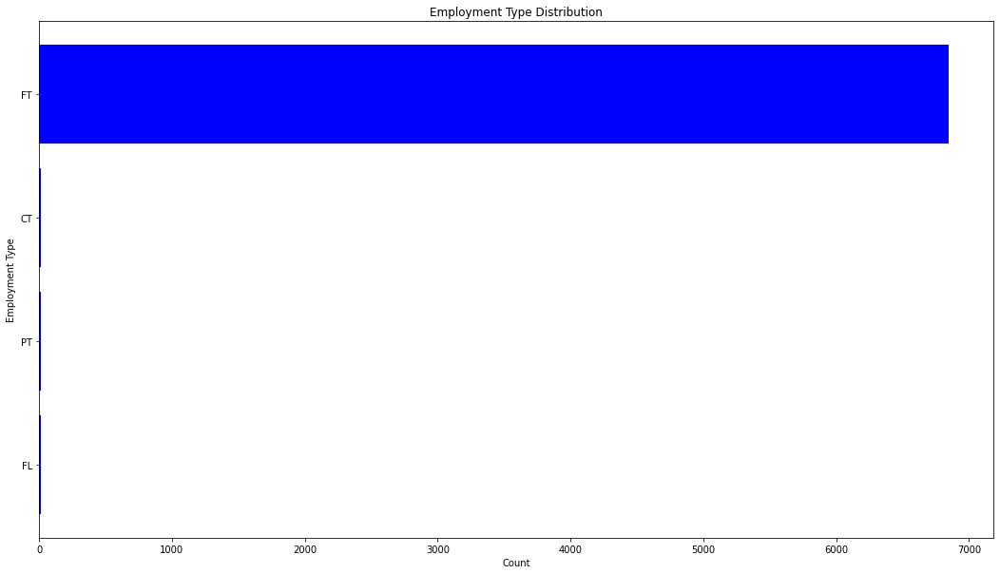

In [0]:
data = df.groupBy("employment_type").count().toPandas()

data = data.sort_values(by="count", ascending=True)

plt.figure(figsize=(18, 10), facecolor='white')
plt.barh(data["employment_type"], data["count"], color='blue')
plt.xlabel("Count")
plt.ylabel("Employment Type")
plt.title("Employment Type Distribution")

plt.show()

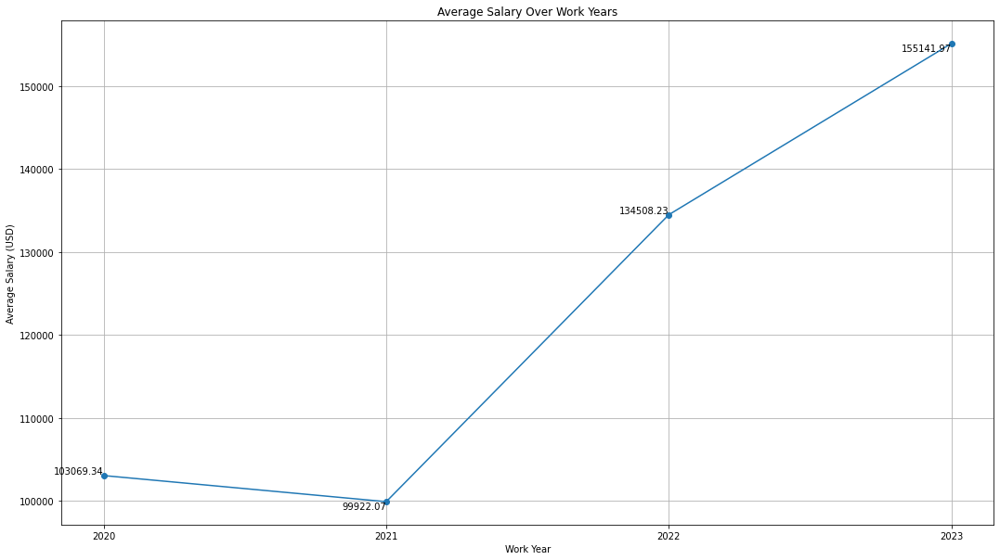

In [0]:
data = df.groupBy("work_year").agg({"salary_in_usd": "avg"}).orderBy("work_year").toPandas()

plt.figure(figsize=(18, 10), facecolor='white')
plt.plot(data["work_year"], data["avg(salary_in_usd)"], marker='o', linestyle='-')
plt.xlabel("Work Year")
plt.ylabel("Average Salary (USD)")
plt.title("Average Salary Over Work Years")
plt.grid(True)

for i, (x, y) in enumerate(zip(data["work_year"], data["avg(salary_in_usd)"])):
    plt.text(x, y, f"{y:.2f}", ha='right', va='bottom' if i % 2 == 0 else 'top')

plt.show()

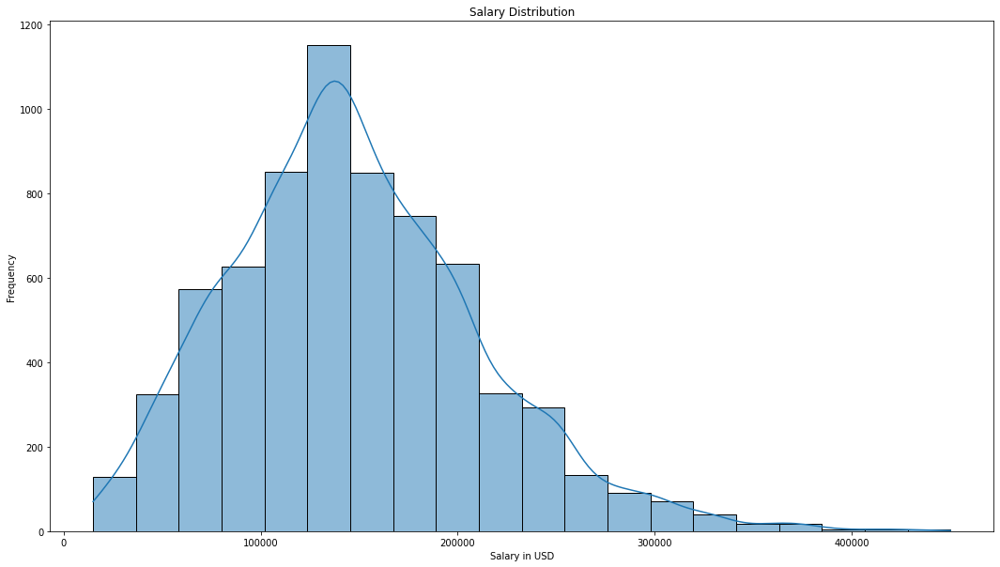

In [0]:
data = df.toPandas()

plt.figure(figsize=(18, 10), facecolor='white')
sns.histplot(data['salary_in_usd'], bins=20, kde=True)
plt.xlabel('Salary in USD')
plt.ylabel('Frequency')
plt.title('Salary Distribution')

plt.show()

In [0]:
display(df)

work_year,experience_level,employment_type,job_title,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
2023,MI,FT,Data Manager,115500.0,US,0.0,US,M
2023,MI,FT,Data Manager,73500.0,US,0.0,US,M
2023,SE,FT,Machine Learning Engineer,309000.0,US,0.0,US,M
2023,SE,FT,Machine Learning Engineer,142000.0,US,0.0,US,M
2023,MI,FT,Bear Robotics,215000.0,US,0.0,US,M
2023,MI,FT,Bear Robotics,120000.0,US,0.0,US,M
2023,SE,FT,Data Engineer,139500.0,US,100.0,US,M
2023,SE,FT,Data Engineer,118575.0,US,100.0,US,M
2023,SE,FT,Data Analyst,129150.0,US,0.0,US,M
2023,SE,FT,Data Analyst,98400.0,US,0.0,US,M


In [0]:
df = df.drop(df.employee_residence, df.company_location)

In [0]:
display(df)

work_year,experience_level,employment_type,job_title,salary_in_usd,remote_ratio,company_size
2023,MI,FT,Data Manager,115500.0,0.0,M
2023,MI,FT,Data Manager,73500.0,0.0,M
2023,SE,FT,Machine Learning Engineer,309000.0,0.0,M
2023,SE,FT,Machine Learning Engineer,142000.0,0.0,M
2023,MI,FT,Bear Robotics,215000.0,0.0,M
2023,MI,FT,Bear Robotics,120000.0,0.0,M
2023,SE,FT,Data Engineer,139500.0,100.0,M
2023,SE,FT,Data Engineer,118575.0,100.0,M
2023,SE,FT,Data Analyst,129150.0,0.0,M
2023,SE,FT,Data Analyst,98400.0,0.0,M


In [0]:
display(df.groupBy("job_title").count())

job_title,count
Data Engineer 2,1
Business Intelligence Analyst,16
Lead Data Engineer,6
Data Modeler,16
AI Architect,10
Data Visualization Specialist,2
Bear Robotics,2
Data Scientist Lead,2
Decision Scientist,32
Principal Data Architect,1


Databricks visualization. Run in Databricks to view.

In [0]:
job_title_mapping = {
    'Data Analyst': [
        'BI Data Analyst', 'Insight Analyst', 'BI Analyst', 'Data Analytics Analyst',
        'Data Quality Analyst', 'Data Analytics Manager', 'Business Data Analyst',
        'Data Manager', 'Data Analytics Engineer', 'Data Specialist', 'Data Analyst Intern',
        'Data Operations Analyst', 'Product Data Analyst', 'Data Visualization Specialist',
        'Data Analytics Specialist', 'Sales Data Analyst', 'Data Analytics Lead',
        'Power BI Developer', 'Lead Data Analyst', 'Data Modeller', 'Data Visualization Analyst',
        'Staff Data Analyst', 'Finance Data Analyst', 'Analytics Engineer', 'Principal Data Analyst',
        'Financial Data Analyst', 'Data Analytics Consultant', 'Data Visualization Engineer',
        'Marketing Data Analyst', 'Compliance Data Analyst', 'Business Intelligence Data Analyst'
    ],
    'Data Engineer': [
        'Data Modeler', 'Data Operations Engineer', 'Principal Data Architect',
        'Data Integration Specialist', 'ETL Developer', 'Data Lead', 'Big Data Engineer',
        'Data Infrastructure Engineer', 'Cloud Database Engineer', 'Data Strategist',
        'Data Engineer 2', 'Principal Data Architect', 'Consultant Data Engineer',
        'Data Operations Specialist', 'Data Quality Engineer', 'Data Management Specialist',
        'Software Data Engineer', 'Cloud Data Architect', 'Cloud Data Engineer',
        'Marketing Data Engineer', 'Azure Data Engineer', 'Data DevOps Engineer',
        'Principal Data Engineer', 'ETL Engineer', 'AWS Data Architect', 'Big Data Architect',
        'Lead Data Engineer', 'Head of Data'
    ],
    'Data Scientist': [
        'Decision Scientist', 'Machine Learning Scientist', 'Principal Data Scientist',
        'Data Science Consultant', 'Research Scientist', 'Data Architect',
        'Machine Learning Developer', 'Research Engineer', 'Data Science Engineer',
        'Applied Scientist', 'Machine Learning Researcher', 'Data Science Manager',
        'Applied Data Scientist', 'Research Analyst', 'Research Scientist',
        'Data Science Practitioner', 'Data Science Lead', 'Data Scientist Lead',
        'Staff Data Scientist', 'Managing Director Data Science', 'Director of Data Science',
        'Head of Data Science', 'Data Science Tech Lead', 'Lead Data Scientist'
    ],
    'Machine Learning Engineer': [
        'Machine Learning Software Engineer', 'Machine Learning Engineer Intern',
        'Machine Learning Infrastructure Engineer', 'MLOps Engineer', 'Computer Vision Engineer',
        'Computer Vision Software Engineer', 'NLP Engineer', 'AI Architect', 'AI Developer',
        'AI Engineer', 'AI Programmer', 'AI Scientist', 'Applied Machine Learning Scientist',
        'Deep Learning Engineer', 'ML Engineer', 'Machine Learning Developer', 'Head of Machine Learning',
        'Deep Learning Researcher', 'Principal Machine Learning Engineer', 'AI Research Engineer',
        'Applied Machine Learning Engineer', 'Lead Machine Learning Engineer', 'Machine Learning Specialist',
        'Machine Learning Research Engineer', 'Staff Machine Learning Engineer'
    ],
    'Business Intelligence Analyst': [
        'Business Intelligence Analyst', 'BI Developer', 'Business Intelligence Engineer',
        'Business Intelligence Developer'
    ]
}

for new_job_title, job_titles_to_replace in job_title_mapping.items():
    df = df.withColumn(
        'job_title',
        F.when(col('job_title').isin(job_titles_to_replace), new_job_title)
        .otherwise(col('job_title'))
    )

In [0]:
window_spec = Window.partitionBy("job_title")
df_with_count = df.withColumn("count", F.count("*").over(window_spec))

filtered_df = df_with_count.filter("count >= 5")
df = filtered_df.drop("count")

In [0]:
display(df.groupBy("job_title").count())

job_title,count
Business Intelligence Analyst,149
Data Analyst,1540
Data Engineer,1833
Data Scientist,2426
Machine Learning Engineer,923


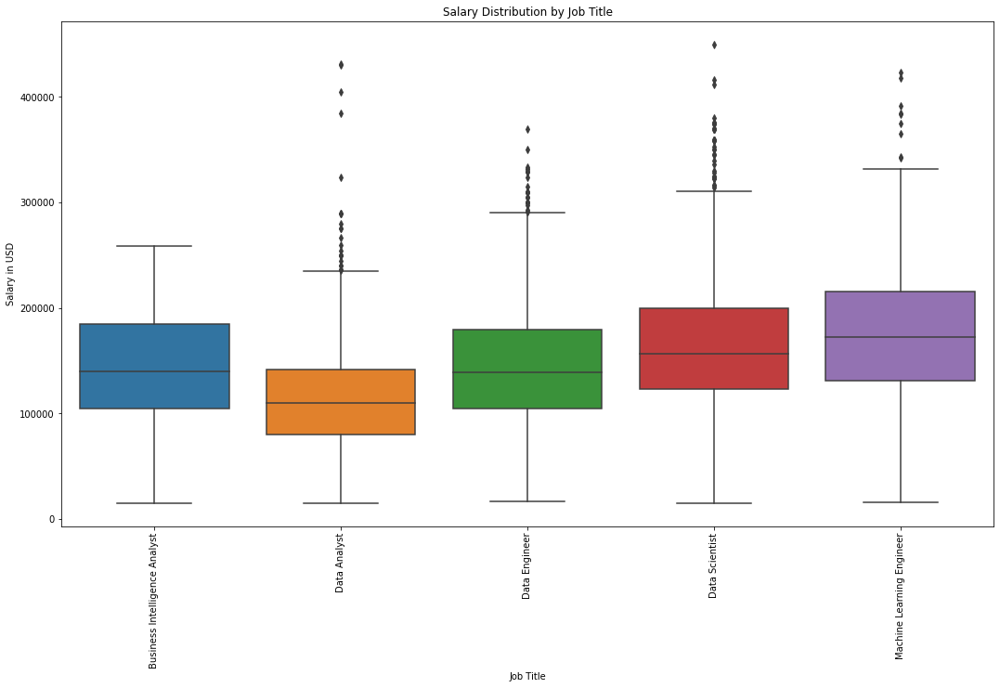

In [0]:
plt.figure(figsize=(18, 10), facecolor='white')
sns.boxplot(x='job_title', y='salary_in_usd', data=df.toPandas())
plt.xticks(rotation=90)
plt.xlabel('Job Title')
plt.ylabel('Salary in USD')
plt.title('Salary Distribution by Job Title')

plt.show()

In [0]:
unique_job_titles = df.select("job_title").distinct()
unique_job_titles_list = [row.job_title for row in unique_job_titles.collect()]

for title in unique_job_titles_list:
    print(title)

Business Intelligence Analyst
Data Analyst
Data Engineer
Data Scientist
Machine Learning Engineer


In [0]:
display(df)

work_year,experience_level,employment_type,job_title,salary_in_usd,remote_ratio,company_size
2023,SE,FT,Business Intelligence Analyst,98010.0,0.0,M
2023,SE,FT,Business Intelligence Analyst,66825.0,0.0,M
2023,SE,FT,Business Intelligence Analyst,98432.0,0.0,M
2023,SE,FT,Business Intelligence Analyst,62442.0,0.0,M
2023,SE,FT,Business Intelligence Analyst,185000.0,0.0,L
2023,SE,FT,Business Intelligence Analyst,79600.0,0.0,L
2023,SE,FT,Business Intelligence Analyst,127000.0,100.0,M
2023,SE,FT,Business Intelligence Analyst,95000.0,100.0,M
2023,SE,FT,Business Intelligence Analyst,220000.0,0.0,M
2023,SE,FT,Business Intelligence Analyst,175000.0,0.0,M


In [0]:
categorical_cols = ["work_year", "experience_level", "employment_type", "job_title", "company_size"]

indexer_stages = [StringIndexer(inputCol=col, outputCol=col + "_index") for col in categorical_cols]
indexer_pipeline = Pipeline(stages=indexer_stages)
indexed_df = indexer_pipeline.fit(df).transform(df)
indexed_df = indexed_df.drop(*categorical_cols)

encoder_stages = [OneHotEncoder(inputCol=col + "_index", outputCol=col + "_encoded") for col in categorical_cols]
encoder_pipeline = Pipeline(stages=encoder_stages)
encoded_df = encoder_pipeline.fit(indexed_df).transform(indexed_df)

drop_cols = categorical_cols + [col + "_index" for col in categorical_cols]
encoded_df = encoded_df.drop(*drop_cols)

feature_cols = [col + "_encoded" for col in categorical_cols] + ["remote_ratio"]
assembler = VectorAssembler(inputCols=feature_cols, outputCol="features")
assembled_df = assembler.transform(encoded_df)

scaler = StandardScaler(inputCol="features", outputCol="scaled_features")
scaler_model = scaler.fit(assembled_df)
scaled_df = scaler_model.transform(assembled_df)

display(scaled_df)

salary_in_usd,remote_ratio,work_year_encoded,experience_level_encoded,employment_type_encoded,job_title_encoded,company_size_encoded,features,scaled_features
98010.0,0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 13), values -> List(1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 13), values -> List(2.2227575179146184, 2.2199793329115702, 13.143656617036937, 3.11585858839204))"
66825.0,0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 13), values -> List(1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 13), values -> List(2.2227575179146184, 2.2199793329115702, 13.143656617036937, 3.11585858839204))"
98432.0,0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 13), values -> List(1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 13), values -> List(2.2227575179146184, 2.2199793329115702, 13.143656617036937, 3.11585858839204))"
62442.0,0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 13), values -> List(1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 13), values -> List(2.2227575179146184, 2.2199793329115702, 13.143656617036937, 3.11585858839204))"
185000.0,0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 14), values -> List(1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(0, 3, 6, 14), values -> List(2.2227575179146184, 2.2199793329115702, 13.143656617036937, 3.4428982773904395))"
79600.0,0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 2, ind

In [0]:
train_data, test_data = scaled_df.randomSplit([0.8, 0.2], seed=123)

In [0]:
from pyspark.ml.regression import RandomForestRegressor

rf = RandomForestRegressor(featuresCol="scaled_features", labelCol="salary_in_usd", numTrees=100)
rf_model = rf.fit(train_data)

predictions = rf_model.transform(test_data)

result_df = predictions.select("features", "salary_in_usd", "prediction")
result_df = result_df.withColumnRenamed("salary_in_usd", "real_value").withColumnRenamed("prediction", "predicted_value")

display(result_df)

features,real_value,predicted_value
"Map(vectorType -> sparse, length -> 16, indices -> List(1, 4, 6, 13, 15), values -> List(1.0, 1.0, 1.0, 1.0, 100.0))",15000.0,107163.70852366391
"Map(vectorType -> sparse, length -> 16, indices -> List(1, 4, 6, 12, 13, 15), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 100.0))",15897.0,110163.70118037304
"Map(vectorType -> sparse, length -> 16, indices -> List(2, 4, 6, 11, 14, 15), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 50.0))",16904.0,72909.68444687471
"Map(vectorType -> sparse, length -> 16, indices -> List(2, 4, 6, 9, 15), values -> List(1.0, 1.0, 1.0, 1.0, 100.0))",16904.0,96987.22698668115
"Map(vectorType -> sparse, length -> 16, indices -> List(1, 4, 6, 11, 13, 15), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 100.0))",17805.0,96629.91799349277
"Map(vectorType -> sparse, length -> 16, indices -> List(0, 4, 6, 11, 14, 15), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 50.0))",18241.0,74684.40015509893
"Map(vectorType -> sparse, length -> 16, indices -> List(0, 5, 6, 9, 14, 15), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 100.0))",19910.0,96864.26685772512
"Map(vectorType -> sparse, length -> 16, indices -> List(4, 6, 11), values -> List(1.0, 1.0, 1.0))",20000.0,87836.18530465964
"Map(vectorType -> sparse, length -> 16, indices -> List(1, 5, 6, 11, 13, 15), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 50.0))",20000.0,72883.92367882964
"Map(vectorType -> sparse, length -> 16, indices -> List(2, 5, 6, 12, 13, 15), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 50.0))",20000.0,70154.78223557804
